In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import pycountry

### Data Processing

In [2]:
df = pd.read_csv('../data/Data.csv')

In [3]:
#We have 14 features and 38472 observations.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38472 entries, 0 to 38471
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Entity                           38472 non-null  object 
 1   Continent                        38472 non-null  object 
 2   Latitude                         38472 non-null  float64
 3   Longitude                        38472 non-null  float64
 4   Average temperature per year     38472 non-null  int64  
 5   Hospital beds per 1000 people    38472 non-null  float64
 6   Medical doctors per 1000 people  38472 non-null  float64
 7   GDP/Capita                       38472 non-null  float64
 8   Population                       38472 non-null  int64  
 9   Median age                       38472 non-null  int64  
 10  Population aged 65 and over (%)  38472 non-null  int64  
 11  Date                             38472 non-null  object 
 12  Daily tests       

In [4]:
#Our Dates are in string format. Let's convert them to datetime format!
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38472 entries, 0 to 38471
Data columns (total 15 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Entity                           38472 non-null  object 
 1   Continent                        38472 non-null  object 
 2   Latitude                         38472 non-null  float64
 3   Longitude                        38472 non-null  float64
 4   Average temperature per year     38472 non-null  int64  
 5   Hospital beds per 1000 people    38472 non-null  float64
 6   Medical doctors per 1000 people  38472 non-null  float64
 7   GDP/Capita                       38472 non-null  float64
 8   Population                       38472 non-null  int64  
 9   Median age                       38472 non-null  int64  
 10  Population aged 65 and over (%)  38472 non-null  int64  
 11  Date                             38472 non-null  object 
 12  Daily tests       

In [5]:
#Our Dates are in string format. Let's convert them to datetime format!
df['Date'] = pd.to_datetime(df['Date'])

In [6]:
# We have 3 features with missing values in ascending order, daily tests of COVID-19, deaths from COVID-19, and daily cases of COVID-19
df.isna().sum().sort_values(ascending=False)

Daily tests                        7895
Deaths                             3610
Cases                               254
Entity                                0
Continent                             0
Latitude                              0
Longitude                             0
Average temperature per year          0
Hospital beds per 1000 people         0
Medical doctors per 1000 people       0
GDP/Capita                            0
Population                            0
Median age                            0
Population aged 65 and over (%)       0
Date                                  0
dtype: int64

In [7]:
# Let's have a peek at our dataset!
df.head()

,Entity,Continent,Latitude,Longitude,Average temperature per year,Hospital beds per 1000 people,Medical doctors per 1000 people,GDP/Capita,Population,Median age,Population aged 65 and over (%),Date,Daily tests,Cases,Deaths
0,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-25,8.0,NaN,NaN
1,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-26,5.0,NaN,NaN
2,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-27,4.0,NaN,NaN
3,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-28,1.0,NaN,NaN
4,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-29,8.0,NaN,NaN


In [9]:
#There are no duplicated rows
df.duplicated().sum()

0

In [10]:
#Entity is the country name and there doesn't seem to be misspelt countries based on eye test. However, let's use pycountry to check!
df['Entity'].sort_values().unique()

array(['Albania', 'Algeria', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Bahrain', 'Bangladesh', 'Belarus', 'Belgium', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Bulgaria', 'Canada',
       'Cape Verde', 'Chile', 'Colombia', 'Costa Rica', 'Croatia', 'Cuba',
       'Cyprus', 'Denmark', 'Dominican Republic', 'Ecuador',
       'El Salvador', 'Estonia', 'Ethiopia', 'Fiji', 'Finland', 'France',
       'Ghana', 'Greece', 'Guatemala', 'Hungary', 'Iceland', 'India',
       'Indonesia', 'Iran', 'Iraq', 'Ireland', 'Israel', 'Italy',
       'Jamaica', 'Japan', 'Jordan', 'Kazakhstan', 'Kenya', 'Kuwait',
       'Latvia', 'Libya', 'Lithuania', 'Luxembourg', 'Madagascar',
       'Malawi', 'Malaysia', 'Malta', 'Mauritania', 'Mexico', 'Mongolia',
       'Morocco', 'Mozambique', 'Myanmar', 'Namibia', 'Nepal',
       'New Zealand', 'Nigeria', 'Norway', 'Oman', 'Pakistan', 'Panama',
       'Paraguay', 'Peru', 'Philippines', 'Poland', 'Portugal', 'Qatar',
       'Romania', 'Russia',

In [11]:
def checkCountryNames(listOfCountries):
    """
    -------------------------------------------------------------------------------
    This function takes a list of countries and returns a list of countries.
    -------------------------------------------------------------------------------
    Input:
    listOfCountries: list of countries
    -------------------------------------------------------------------------------
    Output:
    listOfCountries: list of countries
    -------------------------------------------------------------------------------
    """
    count = 0
    missing_countries = []
    for country in listOfCountries:
        try:
            pycountry.countries.get(name=country)
        except:
            print(f'{country} not found!')
            count+=1
            missing_countries.append(country)
    print(f'Total number of countries not found: {count}')
    return missing_countries

In [12]:
# Excellent! No misspelt countries!
missing_countries = checkCountryNames(df['Entity'].unique())

Total number of countries not found: 0


In [13]:
#There are 7 continents in the world, our dataset has 6. It excludes Antarctica :)
print(df['Continent'].nunique())
print(df['Continent'].unique())

6
['Europe' 'Africa' 'South America' 'Oceania' 'Asia' 'North America']


In [14]:
#Latitude and Longitude are our next features. These are used in our GPS system (Google Maps for example) to locate a point on the Earth's surface!

In [15]:
df.columns

Index(['Entity', 'Continent', 'Latitude', 'Longitude',
       'Average temperature per year', 'Hospital beds per 1000 people',
       'Medical doctors per 1000 people', 'GDP/Capita', 'Population',
       'Median age', 'Population aged 65 and over (%)', 'Date', 'Daily tests',
       'Cases', 'Deaths'],
      dtype='object')

In [16]:
# Our missing data is in the form of NaNs. The features are daily tests, cases and deaths.
# As the data is time sensitive, we can't just fill the missing values with the mean or median of the feature.
# We can group the data by countries, then forward fill the missing values with the previous day's value if it is missing. 
# This is because the cases and deaths are cumulative.
# We can then fill the remaining missing values with the next day's value for the other missing values.
df = df.groupby('Entity').apply(lambda x: x.fillna(method='ffill'))
df = df.groupby('Entity').apply(lambda x: x.fillna(method='bfill'))

In [17]:
#We can use factorize get the numeric representation of an array, and therefore get a unique number to identify each country.
df['ID'] = pd.factorize(df['Entity'])[0]

In [18]:
#Great!
df[['Entity','ID']].drop_duplicates()

,Entity,ID
0,Albania,0
370,Algeria,1
740,Argentina,2
1144,Armenia,3
1509,Australia,4
...,...,...
36618,United States,99
37022,Uruguay,100
37375,Vietnam,101
37778,Zambia,102


<AxesSubplot:>

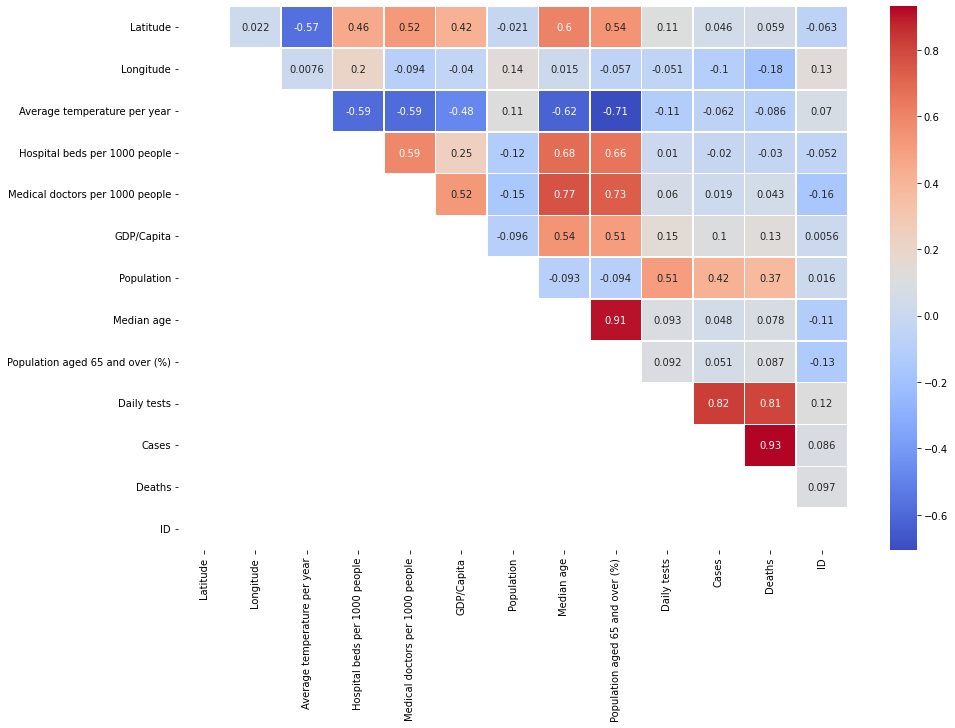

In [31]:
plt.figure(figsize=(15,10))
mask = np.tril(np.ones_like(df.corr(), dtype=bool))
sns.heatmap(df.corr(),annot=True,cmap='coolwarm',linewidths=0.5, mask=mask)

In [20]:
df.head(3)

,Entity,Continent,Latitude,Longitude,Average temperature per year,Hospital beds per 1000 people,Medical doctors per 1000 people,GDP/Capita,Population,Median age,Population aged 65 and over (%),Date,Daily tests,Cases,Deaths,ID
0,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-25,8.0,2.0,1.0,0
1,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-26,5.0,2.0,1.0,0
2,Albania,Europe,41.15,20.17,14,2.89,1.29,5353.2,2873457,38,14,2020-02-27,4.0,2.0,1.0,0


### Conclusion 1:
##### Having an ageing population with an increasing median age or higher % of people aged 65 and over,is correlated with access to hospital beds and doctors for treatment. As countries with aging populations typically have declining fertility rates, higher life expectancy, and higher GDP, they can afford to invest in healthcare. The poorer countries with younger populations have less access to hospital beds and doctors.


In [37]:
visual_1 = px.scatter(df, x='Median age', y='Medical doctors per 1000 people', color='Continent', title='Access to doctors by country', size='GDP/Capita', hover_name='Entity')
visual_1.show()
visual_1.write_html("..//output/Visualization 1.html")

In [22]:
px.scatter(df, x='Median age', y='Hospital beds per 1000 people', color='Continent', title='Access to hospital beds by country', size='GDP/Capita', hover_name='Entity')

In [23]:
df[df['Continent']=="Africa"]['Average temperature per year'].unique()

array([25, 24, 27, 22, 21, 29, 19, 23, 28, 20, 17], dtype=int64)

In [24]:
df['Average temperature per year'] = df['Average temperature per year'].astype(float)

### Conclusion 2: 
##### Average temperature impact on the transmissibility of COVID-19 is not conclusive.
##### Monthly average temperature of a country may be more informative than the annual average temperature.
##### Based on our data, average temperature does not contribute to the spread of the virus.
##### If so, there would be a clearer separation between the yellow and purple scatterplots.
##### I wish I had data on attitudes towards trust on government , covid regulations and apathy as they may be reasons for our outliers. However, our dataset doesn't have this information.

In [36]:
visual_2 = px.scatter(df, x='Date', y='Cases', color='Average temperature per year', title='Number of Covid Cases', hover_name='Entity')
visual_2.show()
visual_2.write_html("..//output/Visualization 2.html")

In [26]:
px.scatter(df, x='Date', y='Deaths', color='Average temperature per year', title='Number of Covid Deaths', hover_name='Entity')

### Conclusion 3: 
####

In [ ]:
px.scatter(df, x='Median age', y='Medical doctors per 1000 people', color='Continent', title='Access to doctors by country', size='GDP/Capita', hover_name='Entity')

In [27]:
Geography: some continents/areas may be more affected by the disease


SyntaxError: invalid syntax (Temp/ipykernel_7000/1258787431.py, line 1)